## Import Libaries

In [1]:
import xarray as xr
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset, random_split
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from utils.dl_helper_functions import (
    load_picture_lagged_data,
)
DTYPE_NUMPY = np.float32  # Set the desired numpy dtype

X, y_lagged, y, common_time = load_picture_lagged_data(
    return_common_time=True,
    verbose=False,
    grid_size=25,
    n_jobs=-1,
    dtype=DTYPE_NUMPY,
    pca=False,
    keep_ocean_data=True,
    eda=False,
    land_values=0.0,  # Set land values to 0.0 for plotting purposes
)

100%|██████████| 20161/20161 [00:03<00:00, 6302.72it/s]


In [2]:
X

array([[[[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         ...,
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          -2.46896144e-01, -2.50460808e-01, -2.43368259e-01],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          -2.17946788e-01, -2.15912450e-01, -2.12850147e-01],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          -2.16313823e-01, -2.15908582e-01, -2.13361531e-01]],

        [[ 0.00000000e+00,  1.02299469e+03,  1.02331377e+03, ...,
           1.02965224e+03,  1.03028896e+03,  0.00000000e+00],
         [ 0.00000000e+00,  1.02334924e+03,  1.02362326e+03, ...,
           1.02977489e

In [3]:
from tqdm import tqdm

# -------------------------------
# 1. Load and prepare data
# -------------------------------
# Lade deine Xarray-Daten (hier als Beispiel)
X_data = X.copy()
y_data = y.copy()

#X_data = np.transpose(X_data, (0, 3, 1, 2))  # → (time, channels, lat, lon)


print(f"X shape: {X_data.shape}, y shape: {y_data.shape}")
# X shape: (20137, 25, 25, 30), y shape: (20137,)


# Nur gültige Zeitfenster: nehme z. B. 168h Input → 24h Output
window_size = 10
forecast_horizon = 5

X_seq, y_seq = [], []
for i in range(len(X_data) - window_size - forecast_horizon):
    X_seq.append(X_data[i:i+window_size])
    y_seq.append(y_data[i+window_size:i+window_size+forecast_horizon])

X_seq = np.array(X_seq)  # (samples, window, channels, lat, lon)
y_seq = np.array(y_seq)  # (samples, 24)






# -------------------------------
# 2. Torch Dataset & Split
# -------------------------------
X_tensor = torch.tensor(X_seq, dtype=torch.float32)
y_tensor = torch.tensor(y_seq, dtype=torch.float32)

# Anzahl der Samples
n_samples = len(X_tensor)

# z.B. 80% Train, 20% Test
train_size = int(0.8 * n_samples)
test_size = n_samples - train_size

# Aufteilen OHNE Mischen
X_train = X_tensor[:train_size]
y_train = y_tensor[:train_size]

X_test = X_tensor[train_size:]
y_test = y_tensor[train_size:]

print(f"Train Shape: {X_train.shape}, {y_train.shape}")
print(f"Test Shape: {X_test.shape}, {y_test.shape}")

# TensorDatasets erstellen
train_ds = TensorDataset(X_train, y_train)
test_ds = TensorDataset(X_test, y_test)






train_loader = DataLoader(train_ds, batch_size=512, shuffle=False)
test_loader = DataLoader(test_ds, batch_size=512, shuffle=False)

# -------------------------------
# 3. Model
# -------------------------------
class OceanCNNForecast(nn.Module):
    def __init__(self, in_channels, forecast_horizon):
        super(OceanCNNForecast, self).__init__()
        self.conv1 = nn.Conv3d(in_channels, 32, kernel_size=3, padding=1)
        self.normalization1 = nn.BatchNorm3d(32)
        self.relu1 = nn.ReLU()
        self.conv2 = nn.Conv3d(32, 64, kernel_size=3, padding=1)
        self.normalization2 = nn.BatchNorm3d(64)
        self.relu2 = nn.ReLU()
        self.conv3 = nn.Conv3d(64, 128, kernel_size=3, padding=1)
        self.normalization3 = nn.BatchNorm3d(128)
        self.relu3 = nn.ReLU()
        self.global_avg_pool = nn.AdaptiveAvgPool3d((1,1,1))
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(128, 64)
        self.relu_fc1 = nn.ReLU()
        self.fc2 = nn.Linear(64, forecast_horizon)

    def forward(self, x):
        x = self.conv1(x)
        x = self.normalization1(x)
        x = self.relu1(x)
        x = self.conv2(x)
        x = self.normalization2(x)
        x = self.relu2(x)
        x = self.conv3(x)
        x = self.normalization3(x)
        x = self.relu3(x)
        x = self.global_avg_pool(x)
        x = self.flatten(x)
        x = self.fc1(x)
        x = self.relu_fc1(x)
        out = self.fc2(x)
        return out

model = OceanCNNForecast(in_channels=X_tensor.shape[1], forecast_horizon=forecast_horizon)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-6, weight_decay=1e-5)

# -------------------------------
# 4. Training
# -------------------------------
print("Starting training...")
epochs = 20
for epoch in tqdm(range(epochs)):
    model.train()
    train_loss = 0.0
    for X_batch, y_batch in train_loader:
        optimizer.zero_grad()
        outputs = model(X_batch)
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * X_batch.size(0)
    avg_loss = train_loss / len(train_loader.dataset)
    print(f"Epoch {epoch+1}/{epochs}, Train Loss: {avg_loss:.4f}")

# -------------------------------
# 5. Testing & Predictions
# -------------------------------
model.eval()
predictions, actuals = [], []
with torch.no_grad():
    for X_batch, y_batch in test_loader:
        outputs = model(X_batch)
        predictions.append(outputs.numpy())
        actuals.append(y_batch.numpy())

predictions = np.vstack(predictions)  # (test_samples, 24)
actuals = np.vstack(actuals)  # (test_samples, 24)



# -------------------------------
# 6. Visualize Predictions
# -------------------------------
# Plot für erste Test-Sample
idx = 0
plt.figure(figsize=(12,6))
plt.plot(range(forecast_horizon), actuals[idx], label='True', marker='o')
plt.plot(range(forecast_horizon), predictions[idx], label='Predicted', marker='x')
plt.xlabel('Hour')
plt.ylabel('Water Level')
plt.title('24h Water Level Forecast')
plt.legend()
plt.grid()
plt.show()


X shape: (20137, 4, 25, 25), y shape: (20137,)
Train Shape: torch.Size([16097, 10, 4, 25, 25]), torch.Size([16097, 5])
Test Shape: torch.Size([4025, 10, 4, 25, 25]), torch.Size([4025, 5])
Starting training...


  5%|▌         | 1/20 [01:01<19:34, 61.82s/it]

Epoch 1/20, Train Loss: 0.0851


  5%|▌         | 1/20 [01:35<30:22, 95.93s/it]


KeyboardInterrupt: 

In [ ]:
import torch
import torch.nn as nn
import numpy as np
from utils.Model_ConvLSTM import CNNLSTM_Regression_Classification
from utils.Model_Training import training_ConvLSTM_Regression_Classification

# --- Deine Klasse importieren oder hier reinkopieren ---
# from dein_modul import CNNLSTM_Regression_Classification

# ----------------------------- Test-Script -----------------------------

def test_model():
    # Set random seed for reproducibility
    torch.manual_seed(42)
    np.random.seed(42)

    # Hyperparameters
    batch_size = 4
    time_steps = 10
    in_channels = 13
    height = 25
    width = 25
    lagged_dim = 7
    n_classes = 3
    forecast_horizon = 168

    # Dummy input data
    weather_seq = torch.randn(batch_size, time_steps, in_channels, height, width)
    y_lagged = torch.randn(batch_size, time_steps, lagged_dim)

    # Initialize model
    model = CNNLSTM_Regression_Classification(
        in_channels=in_channels,
        forecast_horizon=forecast_horizon,
        lagged_input_dim=lagged_dim,
        n_classes=n_classes,
        H=height,
        W=width
    )

    # Move to device
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    weather_seq = weather_seq.to(device)
    y_lagged = y_lagged.to(device)

    # Run forward
    reg_out, class_out = model(weather_seq, y_lagged)

    print("✅ Forward pass successful!")
    print(f"reg_out shape: {reg_out.shape}")         # Expected: (batch_size, forecast_horizon)
    print(f"class_out shape: {class_out.shape}")     # Expected: (batch_size, forecast_horizon, n_classes) 

    # Run predict
    reg_pred, class_pred = model.predict(weather_seq, y_lagged)

    print("✅ Predict pass successful!")
    print(f"reg_pred shape: {reg_pred.shape}")       # Expected: (batch_size, forecast_horizon)
    print(f"class_pred shape: {class_pred.shape}")   # Expected: (batch_size, forecast_horizon)

    # Check for NaNs
    assert not torch.isnan(reg_out).any(), "NaNs detected in reg_out"
    assert not torch.isnan(class_out).any(), "NaNs detected in class_out"
    print("✅ No NaNs detected!")

if __name__ == "__main__":
    test_model()


In [ ]:

# ## Import Libraries

# Standard Libraries
import warnings

# Scientific Libraries
import numpy as np
import optuna
import pandas as pd
import torch
import time
from sklearn.metrics import mean_squared_error, recall_score

# Sklearn
from sklearn.preprocessing import StandardScaler

# Torch Tools
from torch.utils.tensorboard import SummaryWriter

# Custom Utilities
from utils.dl_helper_functions import (
    convert_to_tensors,
    create_sequences,
    load_picture_lagged_data,
    scale_data,
)
from utils.Model_ConvLSTM import CNNLSTM_Regression_Classification
from utils.Model_Training import training_ConvLSTM_Regression_Classification

# Set seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Suppress specific warnings
warnings.filterwarnings("ignore", category=pd.errors.SettingWithCopyWarning)

# Display all columns in pandas
pd.options.display.max_columns = None

# TensorBoard writer
writer = SummaryWriter()

# Define global constants
DTYPE_NUMPY = np.float32              # Datentyp für numpy Arrays
n_jobs = -1                           # Anzahl CPUs für parallele Prozesse
HORIZON = 24                      # 1 Tage Vorhersagehorizont
SEQUENCE_LENGTH = 24              # 1 Tag als Input-Sequenz



storage = "sqlite:///Versuch3_ConvLSTM_CustomScore.db"  # Speicherort für Optuna Studien
study_name = f"{HORIZON}"





# Load data
X, y_lagged, y, common_time = load_picture_lagged_data(
    return_common_time=True,
    verbose=True,
    grid_size=25,
    n_jobs=n_jobs,
    dtype=DTYPE_NUMPY,
    pca=False,
    keep_ocean_data=True,
)



# Daten vorbereiten
X = X.astype(DTYPE_NUMPY)
y_lagged = y_lagged.astype(DTYPE_NUMPY)
y = y.astype(DTYPE_NUMPY)

print(f"X.shape: {X.shape}, y_lagged.shape: {y_lagged.shape}, y.shape: {y.shape}, common_time.shape: {common_time.shape}")


/home/razer/documents/GEOMAR-DeepLearning/.venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm



Loading data from:
../data/numerical_data/points30
../data/numerical_data/points10

Loading ocean, weather and insitu data...

Shapes of loaded DataFrames before feature engineering:
Ocean DataFrame: (9415187, 14)
Weather DataFrame: (2018400, 22)
Insitu DataFrame: (20161, 2)

Feature engineering...

Shapes of loaded DataFrames after feature engineering:

Ocean DataFrame: (9415187, 11)

Weather DataFrame: (2018400, 8)

Insitu DataFrame: (20161, 2)


Converting DataFrames to xarray DataArrays...
Interpolating variable: pressure_msl


Interpolating pressure_msl: 100%|██████████| 20184/20184 [00:10<00:00, 1896.03it/s]


Interpolating variable: surface_pressure


Interpolating surface_pressure: 100%|██████████| 20184/20184 [00:08<00:00, 2250.83it/s]


Interpolating variable: wind_gusts_10m


Interpolating wind_gusts_10m:  96%|█████████▌| 19355/20184 [00:08<00:00, 2040.47it/s]

In [2]:
print("shapes", X.shape, y_lagged.shape, y.shape, common_time.shape)

shapes (19995, 13, 5, 5) (19995, 56) (19995,) (19995,)


In [3]:
from utils.dl_helper_functions import create_sequences_test
x_seq, y_lagged_seq, y_seq = create_sequences_test(X,
    y_lagged,
    y,
    seq_len=SEQUENCE_LENGTH,
    horizon=HORIZON,
    dtype=DTYPE_NUMPY,
    )

print("shapes", x_seq.shape, y_lagged_seq.shape, y_seq.shape)

shapes (19948, 24, 13, 5, 5) (19948, 24, 56) (19948, 24)


In [ ]:

# Cross-Validation Zeitpunkte
folds = {
    "Surge1": pd.Timestamp("2023-02-25 16:00:00"),
    "Surge2": pd.Timestamp("2023-04-01 09:00:00"),
    "Surge3": pd.Timestamp("2023-10-07 20:00:00"),
    "Surge4": pd.Timestamp("2023-10-20 21:00:00"),
    "Surge5": pd.Timestamp("2024-01-03 01:00:00"),
    "Surge6": pd.Timestamp("2024-02-09 15:00:00"),
    "Surge7": pd.Timestamp("2024-12-09 10:00:00"),
    "normal1": pd.Timestamp("2023-07-01 14:00:00"),
    "normal2": pd.Timestamp("2024-04-01 18:00:00"),
    "normal3": pd.Timestamp("2025-01-01 12:00:00"),
}





def custom_score(y_true=None, y_pred=None, bins=[1, 2.00], alpha=0.7):
    
    # Initialisiere Recall- und MSE-Werte
    recalls = []
    for i in range(y_true.shape[1]):  # Iteriere über jede Spalte
        y_true_class = np.digitize(y_true[:, i], bins=bins)
        y_pred_class = np.digitize(y_pred[:, i], bins=bins)
        recalls.append(recall_score(y_true_class, y_pred_class, average="macro"))
    
    mean_recall = np.mean(recalls)  # Durchschnittlicher Recall
    mse = mean_squared_error(y_true, y_pred)
    return alpha * (1 - mean_recall) + (1 - alpha) * mse

def cross_validation_loop(model_name, folds, X, y_lagged, y, common_time, time_delta, trial_params, trial=None):
    fold_results = []

    for surge_name, fold in folds.items():
        start_cutoff = fold - time_delta
        end_cutoff = fold + time_delta
        idx_start_cutoff = np.where(common_time == start_cutoff)[0][0]
        idx_end_cutoff = np.where(common_time == end_cutoff)[0][0]

        X_test = X[idx_start_cutoff:idx_end_cutoff]
        y_lagged_test = y_lagged[idx_start_cutoff:idx_end_cutoff]
        y_test = y[idx_start_cutoff:idx_end_cutoff]

        X_train = X.copy()
        y_lagged_train = y_lagged.copy()
        y_train = y.copy()
        X_train[idx_start_cutoff:idx_end_cutoff] = np.nan
        y_lagged_train[idx_start_cutoff:idx_end_cutoff] = np.nan
        y_train[idx_start_cutoff:idx_end_cutoff] = np.nan


        print("Bevore create_sequences:")
        print(f"X_train shape: {X_train.shape}")
        print(f"y_lagged_train shape: {y_lagged_train.shape}")
        print(f"y_train shape: {y_train.shape}")

        X_train, y_lagged_train, y_train = create_sequences(X_train, y_lagged_train, y_train, SEQUENCE_LENGTH, HORIZON)
        X_test, y_lagged_test, y_test = create_sequences(X_test, y_lagged_test, y_test, SEQUENCE_LENGTH, HORIZON)
        
        print("After create_sequences:")
        print(f"X_train shape: {X_train.shape}")
        print(f"y_lagged_train shape: {y_lagged_train.shape}")
        print(f"y_train shape: {y_train.shape}")
        
        gap = 168
        X_test = X_test[gap:-gap]
        y_lagged_test = y_lagged_test[gap:-gap]
        y_test = y_test[gap:-gap]

        scaler_X = StandardScaler()
        scaler_y = StandardScaler()

        print("Before scaling:")
        print(f"X_train shape: {X_train.shape}")
        print(f"y_lagged_train shape: {y_lagged_train.shape}")
        print(f"y_train shape: {y_train.shape}")
        # Scale the data
        X_train, y_lagged_train, y_train, _, _, _, X_test, y_lagged_test, y_test = scale_data(
            X_scaler=scaler_X, y_lagged_scaler=scaler_y,
            X_train=X_train, y_lagged_train=y_lagged_train, y_train=y_train,
            X_val=None, y_lagged_val=None, y_val=None,
            X_test=X_test, y_lagged_test=y_lagged_test, y_test=y_test,
            dtype=DTYPE_NUMPY, verbose=False
        )
        print("Before converting to tensors:")
        print(f"X_train shape: {X_train.shape}")
        print(f"y_lagged_train shape: {y_lagged_train.shape}")
        print(f"y_train shape: {y_train.shape}")
        # Convert to tensors
        X_train_tensor, y_lagged_train_tensor, y_train_tensor, _, _, _, X_test_tensor, y_lagged_test_tensor, y_test_tensor = convert_to_tensors(
            X_train=X_train, y_lagged_train=y_lagged_train, y_train=y_train,
            X_val=None, y_lagged_val=None, y_val=None,
            X_test=X_test, y_lagged_test=y_lagged_test, y_test=y_test,
            dtype=torch.float32
        )
        print(f"X_train_tensor.shape", X_train_tensor.shape)
        
        model = CNNLSTM_Regression_Classification(
            in_channels=X_train_tensor.shape[2],
            forecast_horizon=HORIZON,
            lagged_input_dim=y_lagged_train_tensor.shape[2],
            H=X_train_tensor.shape[3],
            W=X_train_tensor.shape[4],
            cnn1_out_channels=trial_params["cnn1_out_channels"],
            cnn2_out_channels=trial_params["cnn2_out_channels"],
            cnn1_kernel_size=3,
            cnn1_padding=1,
            cnn2_kernel_size=3,
            cnn2_padding=1,
            cnn_linear_out_features=trial_params["cnn_linear_out_features"],
            lstm_hidden_dim=trial_params["lstm_hidden_dim"],
            lstm_layers=trial_params["lstm_layers"],
            lstm_input_size=trial_params["cnn_linear_out_features"],
            dropout=trial_params["dropout"]
        )

        optimizer = torch.optim.Adam(model.parameters(), lr=trial_params["lr"])

        best_model = training_ConvLSTM_Regression_Classification(
            model,
            X_train=X_train_tensor,
            y_train=y_train_tensor,
            X_val=X_test_tensor,
            y_val=y_test_tensor,
            y_lagged_train=y_lagged_train_tensor,
            y_lagged_val=y_lagged_test_tensor,
            epochs=trial_params["epochs"],
            batch_size=128,
            optimizer=optimizer,
            writer=writer,
            verbose=True,
            log_tensorboard=True,
            patience=20,
            trial=trial
        )

        model.eval()
        with torch.no_grad():
            y_pred, _ = model.predict(X_test_tensor, y_lagged_test_tensor)
            y_pred = y_pred.cpu().numpy()
            y_true = y_test_tensor.cpu().numpy()
            
            
        print(f"Fold: {surge_name}, y_pred shape: {y_pred.shape}, y_true shape: {y_true.shape}")
        score = custom_score(y_true=y_true, y_pred=y_pred, bins=[1.0, 2.00], alpha=0.7)
        fold_results.append(score)

    return fold_results


def objective(trial):
    trial_params = {
        "cnn1_out_channels": trial.suggest_categorical("cnn1_out_channels", [16, 32, 64]),
        "cnn2_out_channels": trial.suggest_categorical("cnn2_out_channels", [32, 64, 128]),
        "cnn_linear_out_features": trial.suggest_categorical("cnn_linear_out_features", [64, 128, 256]),
        "lstm_hidden_dim": trial.suggest_categorical("lstm_hidden_dim", [32, 64, 128]),
        "lstm_layers": trial.suggest_int("lstm_layers", 1, 3),
        "dropout": trial.suggest_float("dropout", 0.1, 0.6),
        "lr": trial.suggest_float("lr", 0.0001, 0.1, log=True),
        "epochs": 1000,
    }

    scores = cross_validation_loop(
        model_name="ConvLSTM",
        folds=folds,
        X=X.astype(DTYPE_NUMPY),
        y_lagged=y_lagged.astype(DTYPE_NUMPY),
        y=y.astype(DTYPE_NUMPY),
        common_time=common_time,
        time_delta=pd.Timedelta(hours=168 * 4),
        trial_params=trial_params,
        trial=trial
    )

    return np.mean(scores)


study = optuna.create_study(direction="minimize", study_name=study_name, 
    #storage=storage, 
    load_if_exists=True)
study.optimize(objective, n_trials=1000)  

print("Beste Parameter:", study.best_params)
print("Bester Score:", study.best_value)





[I 2025-07-08 21:53:47,833] A new study created in memory with name: 24


Bevore create_sequences:
X_train shape: (19995, 13, 5, 5)
y_lagged_train shape: (19995, 56)
y_train shape: (19995,)
After create_sequences:
X_train shape: (18557, 24, 13, 5, 5)
y_lagged_train shape: (18557, 24, 56)
y_train shape: (18557, 24)
Before scaling:
X_train shape: (18557, 24, 13, 5, 5)
y_lagged_train shape: (18557, 24, 56)
y_train shape: (18557, 24)
Before converting to tensors:
X_train shape: (18557, 24, 13, 5, 5)
y_lagged_train shape: (18557, 24, 56)
y_train shape: (18557, 24)
X_train_tensor.shape torch.Size([18557, 24, 13, 5, 5])
| Epoch   1 | Train Loss: 0.8433 | Val Loss: 0.6623 | MSE Train: 0.1222 | MSE Val: 0.1879 | Time: 7.87s
| Epoch   2 | Train Loss: 0.6399 | Val Loss: 0.4699 | MSE Train: 0.0984 | MSE Val: 0.1446 | Time: 6.95s
| Epoch   3 | Train Loss: 0.4938 | Val Loss: 0.3233 | MSE Train: 0.0847 | MSE Val: 0.1281 | Time: 7.13s
| Epoch   4 | Train Loss: 0.3826 | Val Loss: 0.2494 | MSE Train: 0.0802 | MSE Val: 0.1211 | Time: 7.15s


[W 2025-07-08 21:54:29,704] Trial 0 failed with parameters: {'cnn1_out_channels': 32, 'cnn2_out_channels': 32, 'cnn_linear_out_features': 64, 'lstm_hidden_dim': 32, 'lstm_layers': 1, 'dropout': 0.5788112870801384, 'lr': 0.00011912451137999164} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "/home/razer/documents/GEOMAR-DeepLearning/.venv/lib/python3.11/site-packages/optuna/study/_optimize.py", line 197, in _run_trial
    value_or_values = func(trial)
                      ^^^^^^^^^^^
  File "/tmp/ipykernel_16689/3920869361.py", line 163, in objective
    scores = cross_validation_loop(
             ^^^^^^^^^^^^^^^^^^^^^^
  File "/tmp/ipykernel_16689/3920869361.py", line 119, in cross_validation_loop
    best_model = training_ConvLSTM_Regression_Classification(
                 ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/razer/documents/GEOMAR-DeepLearning/code/utils/Model_Training.py", line 384, in training_ConvLSTM_Regress

KeyboardInterrupt: 

In [ ]:
dd

In [ ]:
import torch 
from utils.Model_Training import training_ConvLSTM_Regression_Classification
from utils.Model_ConvLSTM import CNNLSTM_Regression_Classification
# create random tensors with shape (batch_size, Sequence channels, height, width)
batch_size = 256
channels = 13
height = 25
width = 25
SEQUENCE_LENGTH = 24
train = torch.randn(batch_size, SEQUENCE_LENGTH, channels, height, width)
val = torch.randn(batch_size, SEQUENCE_LENGTH, channels, height, width)

# create random lagged tensor with shape (batch_size, 40)
y_lagged_train = torch.randn(batch_size, SEQUENCE_LENGTH, 40)
y_lagged_val = torch.randn(batch_size, SEQUENCE_LENGTH, 40)

#create random tensor with shape (batch_size, HORIZON)
HORIZON = 24
y_train = torch.randn(batch_size, HORIZON)
y_val = torch.randn(batch_size, HORIZON)

model = CNNLSTM_Regression_Classification(
            in_channels=train.shape[2],
            forecast_horizon=HORIZON,
            lagged_input_dim=y_lagged_train.shape[2],
            H=train.shape[3],
            W=train.shape[4],
            cnn1_out_channels=128,
            cnn2_out_channels=256,
            cnn1_kernel_size=3,
            cnn1_padding=1,
            cnn2_kernel_size=3,
            cnn2_padding=1,
            cnn_linear_out_features=128,
            lstm_hidden_dim=128,
            lstm_layers=2,
            lstm_input_size=128,
            dropout=0.1
        )

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

best_model = training_ConvLSTM_Regression_Classification(
            model,
            X_train=train,
            y_train=y_train,
            X_val=val,
            y_val=y_val,
            y_lagged_train=y_lagged_train,
            y_lagged_val=y_lagged_val,
            epochs=1,
            batch_size=128,
            optimizer=optimizer,
            writer=None,
            verbose=True,
            log_tensorboard=True,
            patience=20,
        )




y_class_train shape: torch.Size([256, 24])
pre_class_train shape: torch.Size([256, 24])

y_class_val shape: torch.Size([256, 24])
pre_class_val shape: torch.Size([256, 24])
Best validation MSE: inf


In [ ]:
import torch
import numpy as np
from sklearn.preprocessing import StandardScaler
from utils.dl_helper_functions import (load_picture_lagged_data, 
                                       create_sequences, 
                                       create_train_val_test_split,
                                       scale_data, 
                                       convert_to_tensors)


# x_scaler = StandardScaler()
# y_lagged_scaler = StandardScaler()

# X, y_lagged, y = load_picture_lagged_data()

# X_seq, y_lagged_seq, y_seq = create_sequences(X, y_lagged, y, seq_len=168, horizon=168)

# data = create_train_val_test_split(X=X_seq, 
#                                     y_lagged=y_lagged_seq, 
#                                     y=y_seq, 
#                                     train_percentage=0.5, 
#                                     val_percentage=0.2, 
#                                     test_percentage=0.3)
# # unpack the data
# X_train, y_lagged_train, y_train, X_val, y_lagged_val, y_val, X_test, y_lagged_test, y_test = data

# data = scale_data(X_scaler=x_scaler,
#                     y_lagged_scaler=y_lagged_scaler,

#                     X_train=X_train, 
#                     y_lagged_train=y_lagged_train, 
#                     y_train=y_train, 

#                     X_val=X_val, 
#                     y_lagged_val=y_lagged_val, 
#                     y_val=y_val, 

#                     X_test=X_test, 
#                     y_lagged_test=y_lagged_test, 
#                     y_test=y_test)

# # unpack the data
# X_train_scaled, y_lagged_train_scaled, y_train_scaled, X_val_scaled, y_lagged_val_scaled, y_val_scaled, X_test_scaled, y_lagged_test_scaled, y_test_scaled = data

# data = convert_to_tensors(X_train=X_train_scaled, 
#                         y_lagged_train=y_lagged_train_scaled, 
#                         y_train=y_train_scaled, 

#                         X_val=X_val_scaled, 
#                         y_lagged_val=y_lagged_val_scaled, 
#                         y_val=y_val_scaled,

#                         X_test=X_test_scaled, 
#                         y_lagged_test=y_lagged_test_scaled, 
#                         y_test=y_test_scaled)

# # unpack the data
# X_train_tensor, y_lagged_train_tensor, y_train_tensor, X_val_tensor, y_lagged_val_tensor, y_val_tensor, X_test_tensor, y_lagged_test_tensor, y_test_tensor = data

# print("\nShapes of training tensors:")
# print("X_train_tensor shape:", X_train_tensor.shape)
# print("y_lagged_train_tensor shape:", y_lagged_train_tensor.shape)
# print("y_train_tensor shape:", y_train_tensor.shape)
# print("\nShapes of validation tensors:")
# print("X_val_tensor shape:", X_val_tensor.shape)
# print("y_lagged_val_tensor shape:", y_lagged_val_tensor.shape)
# print("y_val_tensor shape:", y_val_tensor.shape)
# print("\nShapes of test tensors:")
# print("X_test_tensor shape:", X_test_tensor.shape)
# print("y_lagged_test_tensor shape:", y_lagged_test_tensor.shape)
# print("y_test_tensor shape:", y_test_tensor.shape)


In [ ]:
# create cross-validation folds

HORIZON = 168
INITIAL_TRAINING_SIZE = 24 * 183   # 6 months of data = 4392 h
SEQUENCE_LENGTH = 168  # 7 days of data

data = np.array([i for i in range(1, 20000 + 1)])


# sequential cross-validation folds
for i, start in enumerate(range(INITIAL_TRAINING_SIZE, len(data) - HORIZON + 1, SEQUENCE_LENGTH)):


    X_train_fold = data[0: start]

    

    X_val_fold = data[start: start + SEQUENCE_LENGTH]
    X_test_fold = data[start + SEQUENCE_LENGTH: start + SEQUENCE_LENGTH + SEQUENCE_LENGTH]


    print(f"Fold {i + 1}:")
    print("X_train_fold shape:", X_train_fold.shape)
    print("X_val_fold shape:", X_val_fold.shape)
    print("X_test_fold shape:", X_test_fold.shape)
    print("X_train_fold:", X_train_fold)
    print("X_val_fold:", X_val_fold)
    print("X_test_fold:", X_test_fold)

    print("-" * 40)
    break


Fold 1:
X_train_fold shape: (4392,)
X_val_fold shape: (168,)
X_test_fold shape: (168,)
X_train_fold: [   1    2    3 ... 4390 4391 4392]
X_val_fold: [4393 4394 4395 4396 4397 4398 4399 4400 4401 4402 4403 4404 4405 4406
 4407 4408 4409 4410 4411 4412 4413 4414 4415 4416 4417 4418 4419 4420
 4421 4422 4423 4424 4425 4426 4427 4428 4429 4430 4431 4432 4433 4434
 4435 4436 4437 4438 4439 4440 4441 4442 4443 4444 4445 4446 4447 4448
 4449 4450 4451 4452 4453 4454 4455 4456 4457 4458 4459 4460 4461 4462
 4463 4464 4465 4466 4467 4468 4469 4470 4471 4472 4473 4474 4475 4476
 4477 4478 4479 4480 4481 4482 4483 4484 4485 4486 4487 4488 4489 4490
 4491 4492 4493 4494 4495 4496 4497 4498 4499 4500 4501 4502 4503 4504
 4505 4506 4507 4508 4509 4510 4511 4512 4513 4514 4515 4516 4517 4518
 4519 4520 4521 4522 4523 4524 4525 4526 4527 4528 4529 4530 4531 4532
 4533 4534 4535 4536 4537 4538 4539 4540 4541 4542 4543 4544 4545 4546
 4547 4548 4549 4550 4551 4552 4553 4554 4555 4556 4557 4558 4559 4560

In [ ]:
X, y_lagged, y, common_time = load_picture_lagged_data(return_common_time=True, verbose=True, grid_size=5)



Loading data from:
../data/numerical_data/points30
../data/numerical_data/points10

Loading ocean, weather and insitu data...

Shapes of loaded DataFrames before feature engineering:
Ocean DataFrame: (9415187, 14)
Weather DataFrame: (2018400, 22)
Insitu DataFrame: (20161, 2)

Feature engineering...

Shapes of loaded DataFrames after feature engineering:
Ocean DataFrame: (9415187, 11)
Weather DataFrame: (2018400, 8)
Insitu DataFrame: (20161, 2)

Converting DataFrames to xarray DataArrays...
Interpolating variable: pressure_msl


Interpolating pressure_msl: 100%|██████████| 20184/20184 [00:22<00:00, 911.43it/s] 


Interpolating variable: surface_pressure


Interpolating surface_pressure: 100%|██████████| 20184/20184 [00:04<00:00, 4286.92it/s]


Interpolating variable: wind_gusts_10m


Interpolating wind_gusts_10m: 100%|██████████| 20184/20184 [00:04<00:00, 4061.77it/s]


Interpolating variable: wind_u


Interpolating wind_u: 100%|██████████| 20184/20184 [00:04<00:00, 4234.61it/s]


Interpolating variable: wind_v


Interpolating wind_v: 100%|██████████| 20184/20184 [00:04<00:00, 4058.80it/s]


Interpolate: bottomT


100%|██████████| 20161/20161 [00:02<00:00, 7858.27it/s]


Interpolate: sla


100%|██████████| 20161/20161 [00:02<00:00, 7136.12it/s]


Interpolate: so


100%|██████████| 20161/20161 [00:02<00:00, 7791.59it/s]


Interpolate: sob


100%|██████████| 20161/20161 [00:02<00:00, 7251.62it/s]


Interpolate: thetao


100%|██████████| 20161/20161 [00:02<00:00, 9332.84it/s] 


Interpolate: uo


100%|██████████| 20161/20161 [00:02<00:00, 7059.76it/s]


Interpolate: vo


100%|██████████| 20161/20161 [00:02<00:00, 7877.13it/s]


Interpolate: wo


100%|██████████| 20161/20161 [00:02<00:00, 6925.21it/s]



Ocean DataArray:
<xarray.Dataset> Size: 32MB
Dimensions:    (time: 20161, latitude: 5, longitude: 5)
Coordinates:
  * time       (time) datetime64[ns] 161kB 2022-12-03 ... 2025-03-22
  * latitude   (latitude) float64 40B 53.72 55.3 56.87 58.44 60.01
  * longitude  (longitude) float64 40B 9.097 12.57 16.04 19.51 22.99
Data variables:
    bottomT    (time, latitude, longitude) float64 4MB nan nan ... 4.901 1.237
    sla        (time, latitude, longitude) float64 4MB nan nan ... -0.1225
    so         (time, latitude, longitude) float64 4MB nan nan ... 5.885 3.865
    sob        (time, latitude, longitude) float64 4MB nan nan ... 6.93 4.504
    thetao     (time, latitude, longitude) float64 4MB nan nan ... 2.248 1.52
    uo         (time, latitude, longitude) float64 4MB nan nan ... -0.01419
    vo         (time, latitude, longitude) float64 4MB nan nan ... 0.01045
    wo         (time, latitude, longitude) float64 4MB nan nan ... 1.011e-08

Weather DataArray:
<xarray.Dataset> Size: 20MB


Fold 1:
X_train_scaled shape: (1614, 381)
y_train shape: (1614, 168)
X_test_scaled shape: (1, 381)
y_test shape: (1, 168)
y_pred shape: (1, 168)


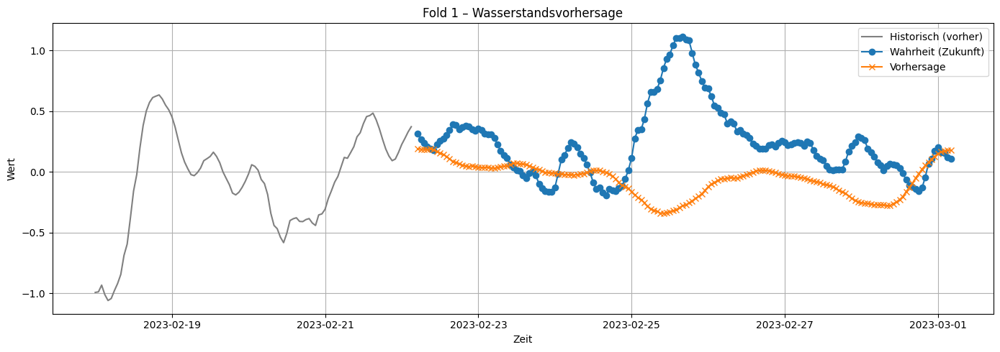


Fold 2:
X_train_scaled shape: (2447, 381)
y_train shape: (2447, 168)
X_test_scaled shape: (1, 381)
y_test shape: (1, 168)
y_pred shape: (1, 168)


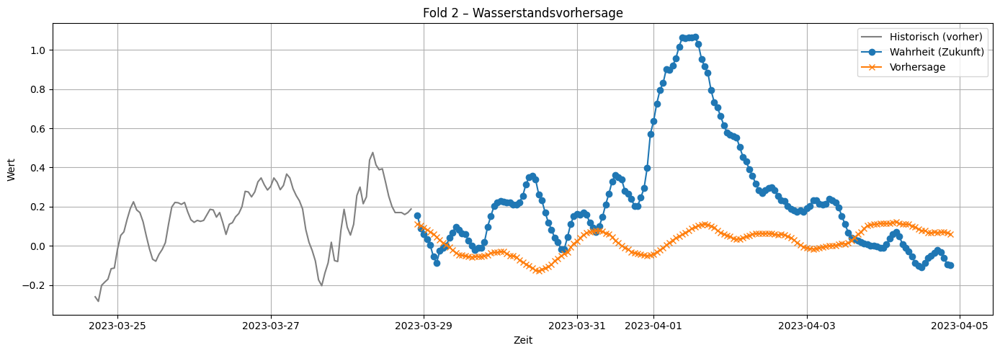


Fold 3:
X_train_scaled shape: (7307, 381)
y_train shape: (7307, 168)
X_test_scaled shape: (1, 381)
y_test shape: (1, 168)
y_pred shape: (1, 168)


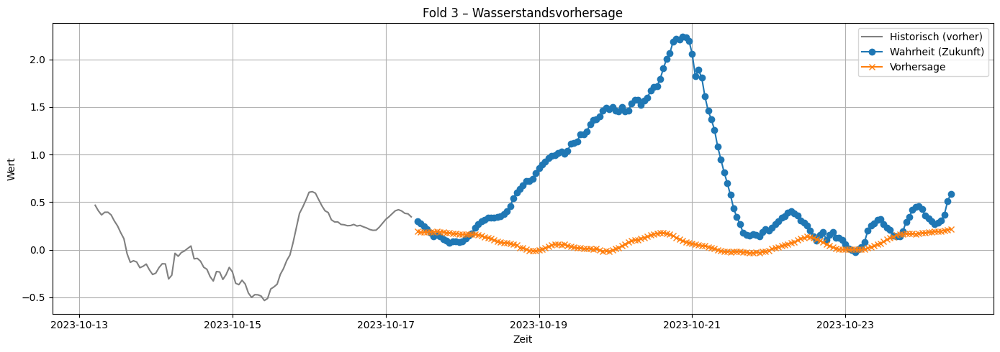


Fold 4:
X_train_scaled shape: (9087, 381)
y_train shape: (9087, 168)
X_test_scaled shape: (1, 381)
y_test shape: (1, 168)
y_pred shape: (1, 168)


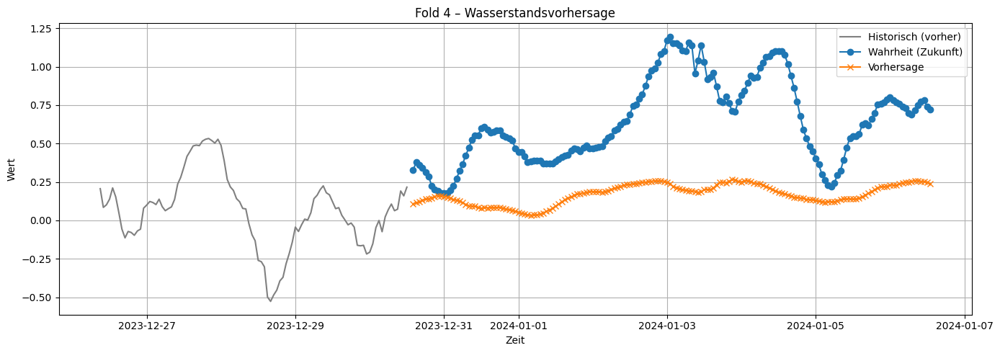


Fold 5:
X_train_scaled shape: (9989, 381)
y_train shape: (9989, 168)
X_test_scaled shape: (1, 381)
y_test shape: (1, 168)
y_pred shape: (1, 168)


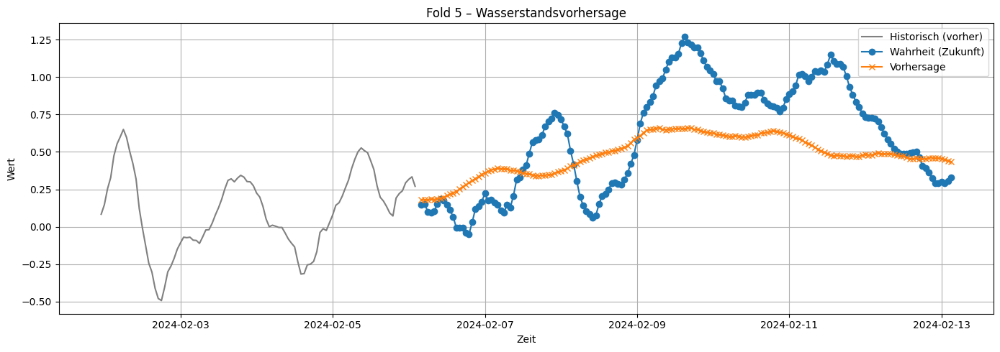


Fold 6:
X_train_scaled shape: (17280, 381)
y_train shape: (17280, 168)
X_test_scaled shape: (1, 381)
y_test shape: (1, 168)
y_pred shape: (1, 168)


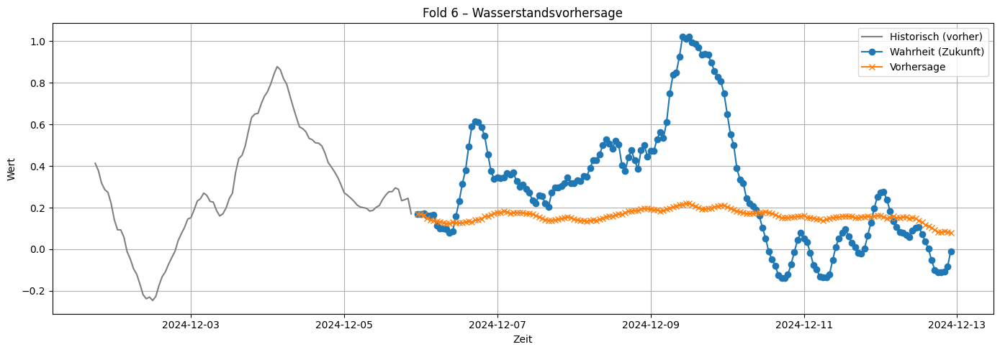


Fold 7:
X_train_scaled shape: (19348, 381)
y_train shape: (19348, 168)
X_test_scaled shape: (1, 381)
y_test shape: (1, 168)
y_pred shape: (1, 168)


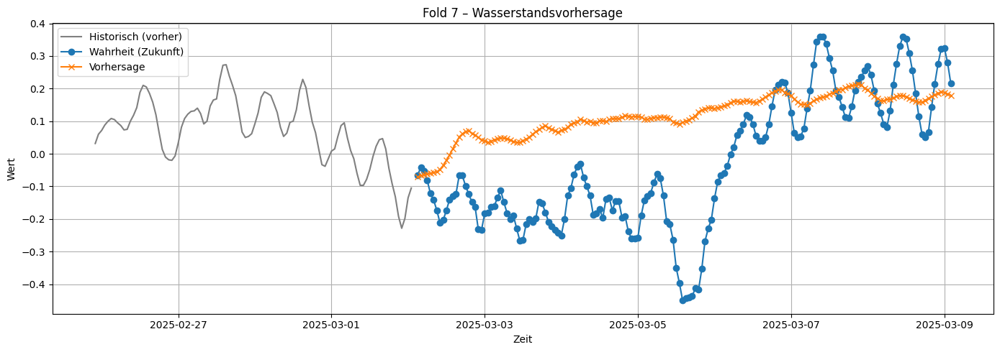

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor

def create_y_target_matrix(y, horizon):
    """
    Erzeugt eine Matrix, in der jede Zeile die nächsten `horizon` Werte der Zeitreihe enthält.
    """
    y = np.asarray(y)
    return np.array([y[i + 1:i + 1 + horizon] for i in range(len(y) - horizon)])

# Beispiel-Zeitpunkte (deine echten Timestamps)
times = [
    pd.Timestamp("2023-02-25 16:00:00")- pd.Timedelta(hours=HORIZON / 2),  # Beispiel: 1 Stunde vor dem Cutoff
    pd.Timestamp("2023-04-01 09:00:00")- pd.Timedelta(hours=HORIZON / 2),
    pd.Timestamp("2023-10-20 21:00:00")- pd.Timedelta(hours=HORIZON / 2),
    pd.Timestamp("2024-01-03 01:00:00")- pd.Timedelta(hours=HORIZON / 2),
    pd.Timestamp("2024-02-09 15:00:00")- pd.Timedelta(hours=HORIZON / 2),
    pd.Timestamp("2024-12-09 10:00:00")- pd.Timedelta(hours=HORIZON / 2),
    pd.Timestamp("2025-03-05 14:00:00") - pd.Timedelta(hours=HORIZON / 2),
]





for i, time in enumerate(times):
    try:
        idx_cutoff = np.where(common_time == time)[0][0]
    except IndexError:
        print(f"Zeitpunkt {time} nicht in common_time gefunden.")
        continue

    if idx_cutoff + HORIZON > len(y):
        print(f"Nicht genug Daten nach {time} für Horizon={HORIZON}")
        continue

    train_start = 0
    train_end = idx_cutoff

    test_start = idx_cutoff
    test_end = idx_cutoff + 1

    # Trainingsdaten
    X_train = X[train_start:train_end]
    y_lagged_train = y_lagged[train_start:train_end]

    # Zielmatrix (Multi-Output: jede Zeile = 168h-Vorhersage)
    y_target_matrix = create_y_target_matrix(y[train_start:train_end], HORIZON)


    # Kürzen auf gemeinsame Länge
    N = min(len(X_train), len(y_lagged_train), len(y_target_matrix))
    X_train = X_train[:N]
    y_lagged_train = y_lagged_train[:N]
    y_train = y_target_matrix[:N]

    # Testdaten vorbereiten (1 Beispiel)
    X_test = X[test_start:test_end]
    y_lagged_test = y_lagged[test_start:test_end]
    y_test = y[test_start + 1 : test_start + 1 + HORIZON].reshape(1, -1)

    # Skalierung vorbereiten
    X_scaler = StandardScaler()
    y_lagged_scaler = StandardScaler()

    # Reshape + Skalierung
    X_train_reshaped = X_train.reshape(N, -1)
    y_lagged_train_scaled = y_lagged_scaler.fit_transform(y_lagged_train)
    X_train_scaled = X_scaler.fit_transform(np.hstack([X_train_reshaped, y_lagged_train_scaled]))

    # Test-Sample
    X_test_reshaped = X_test.reshape(1, -1)
    y_lagged_test_scaled = y_lagged_scaler.transform(y_lagged_test)
    X_test_scaled = X_scaler.transform(np.hstack([X_test_reshaped, y_lagged_test_scaled]))

    # Modelltraining
    model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
    model.fit(X_train_scaled, y_train)

    # Vorhersage
    y_pred = model.predict(X_test_scaled)

    # Ausgabe
    print(f"\nFold {i + 1}:")
    print("X_train_scaled shape:", X_train_scaled.shape)
    print("y_train shape:", y_train.shape)
    print("X_test_scaled shape:", X_test_scaled.shape)
    print("y_test shape:", y_test.shape)
    print("y_pred shape:", y_pred.shape)

    # Optional: Plot
    import matplotlib.pyplot as plt

    # Historische Werte vor dem Cutoff – max. 100 zurück
    hist_start = max(0, idx_cutoff - 100)
    historical_y = y[hist_start:idx_cutoff]
    historical_t = common_time[hist_start:idx_cutoff]

    # Zeitachse für Vorhersage
    forecast_t = common_time[idx_cutoff + 1 : idx_cutoff + 1 + HORIZON]

    # Zusammenführen für Plot
    plt.figure(figsize=(14, 5))

    # Historische Daten
    plt.plot(historical_t, historical_y, label="Historisch (vorher)", color="gray")

    # Wahre zukünftige Werte
    plt.plot(forecast_t, y_test.flatten(), label="Wahrheit (Zukunft)", marker="o")

    # Modellvorhersage
    plt.plot(forecast_t, y_pred.flatten(), label="Vorhersage", marker="x")

    plt.title(f"Fold {i+1} – Wasserstandsvorhersage")
    plt.xlabel("Zeit")
    plt.ylabel("Wert")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()
    break



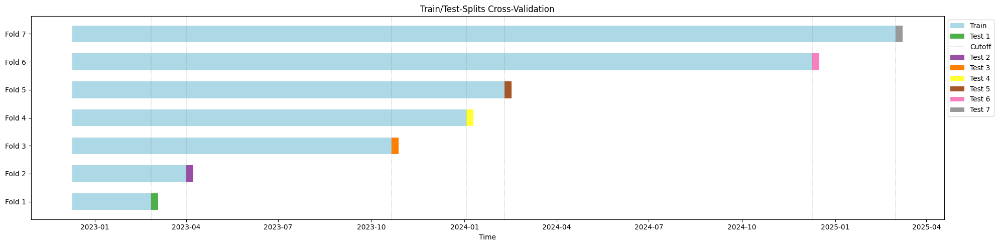

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Liste der Zeitpunkte (Cutoffs)
times = [
    pd.Timestamp("2023-02-25 16:00:00"),
    pd.Timestamp("2023-04-01 09:00:00"),
    pd.Timestamp("2023-10-20 21:00:00"),
    pd.Timestamp("2024-01-03 01:00:00"),
    pd.Timestamp("2024-02-09 15:00:00"),
    pd.Timestamp("2024-12-09 10:00:00"),
    pd.Timestamp("2025-03-01 14:00:00"),
]

fig, ax = plt.subplots(figsize=(20, 5))

# Farben
colors = plt.cm.Set1(np.linspace(0.3, 1, len(times)))

# Sammle alle Bar-Daten
for i, time in enumerate(times):
    try:
        idx_cutoff = np.where(common_time == time)[0][0]
    except IndexError:
        print(f"Zeitpunkt {time} nicht in common_time gefunden.")
        continue

    if idx_cutoff + HORIZON > len(y):
        print(f"Nicht genug Daten nach {time} für Horizon={HORIZON}")
        continue

    # Zeitfenster extrahieren
    start_train = common_time[0]
    end_train = common_time[idx_cutoff - 1]

    start_test = common_time[idx_cutoff]
    end_test = common_time[idx_cutoff + HORIZON - 1]

    # Balken zeichnen (Train blau, Test farbig)
    ax.broken_barh(
        [(start_train, end_train - start_train)],
        (i - 0.3, 0.6), facecolors='lightblue', label='Train' if i == 0 else ""
    )
    ax.broken_barh(
        [(start_test, end_test - start_test)],
        (i - 0.3, 0.6), facecolors=colors[i], label=f'Test {i+1}'
    )

    # vertical line for cutoff
    ax.axvline(x=time, color='grey', linestyle='--', linewidth=0.3, label='Cutoff' if i == 0 else "")
    # label time on x achses where cutoff is
    # ax.text(time, i - 0.3, time.strftime('%Y-%m-%d %H:%M'), 
    #         rotation=90, ha='right', va='center',
    #         fontsize=8, color='black', bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

# Achsen & Beschriftung
ax.set_yticks(range(len(times)))
ax.set_yticklabels([f'Fold {i+1}' for i in range(len(times))])
ax.set_xlabel("Time")
ax.set_title("Train/Test-Splits Cross-Validation")
ax.grid(False, axis='x')
ax.legend(loc="upper left", bbox_to_anchor=(1.0, 1.0))
plt.tight_layout()
plt.show()


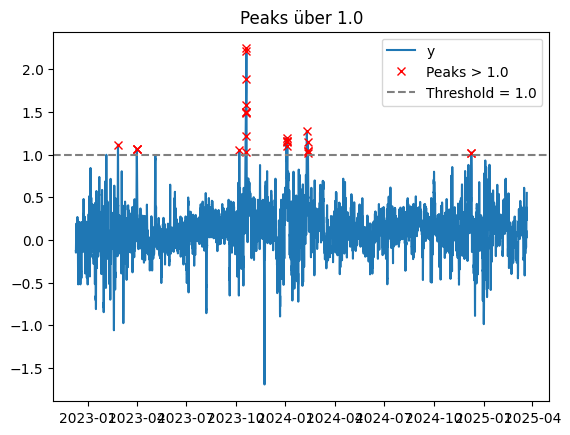

Peak bei Index 1866: Wert = 1.12, Zeitpunkt = 2023-02-25T16:00:00.000000000
Peak bei Index 2699: Wert = 1.06, Zeitpunkt = 2023-04-01T09:00:00.000000000
Peak bei Index 2701: Wert = 1.06, Zeitpunkt = 2023-04-01T11:00:00.000000000
Peak bei Index 2703: Wert = 1.07, Zeitpunkt = 2023-04-01T13:00:00.000000000
Peak bei Index 7246: Wert = 1.05, Zeitpunkt = 2023-10-07T20:00:00.000000000
Peak bei Index 7521: Wert = 1.03, Zeitpunkt = 2023-10-19T07:00:00.000000000
Peak bei Index 7527: Wert = 1.21, Zeitpunkt = 2023-10-19T13:00:00.000000000
Peak bei Index 7535: Wert = 1.49, Zeitpunkt = 2023-10-19T21:00:00.000000000
Peak bei Index 7537: Wert = 1.50, Zeitpunkt = 2023-10-19T23:00:00.000000000
Peak bei Index 7540: Wert = 1.50, Zeitpunkt = 2023-10-20T02:00:00.000000000
Peak bei Index 7544: Wert = 1.58, Zeitpunkt = 2023-10-20T06:00:00.000000000
Peak bei Index 7557: Wert = 2.21, Zeitpunkt = 2023-10-20T19:00:00.000000000
Peak bei Index 7559: Wert = 2.24, Zeitpunkt = 2023-10-20T21:00:00.000000000
Peak bei Ind

In [ ]:
import numpy as np
from scipy.signal import find_peaks
import matplotlib.pyplot as plt

# Beispiel: 1D-Zeitreihe y
# y = np.array([...])  # dein echter Datensatz

# Peaks finden, die über 1.0 liegen
peaks, properties = find_peaks(y, height=1.0)

# Höhe der Peaks (für Kontrolle)
peak_heights = properties["peak_heights"]

# Visualisierung (optional)
plt.plot(common_time, y, label="y")
plt.plot(common_time[peaks], y[peaks], "rx", label="Peaks > 1.0")
plt.axhline(1.0, color="gray", linestyle="--", label="Threshold = 1.0")
plt.legend()
plt.title("Peaks über 1.0")
plt.show()

for i in peaks:
    print(f"Peak bei Index {i}: Wert = {y[i]:.2f}, Zeitpunkt = {common_time[i]}")



In [ ]:
HORIZON = 24
INITIAL_TRAINING_SIZE = 24 * 183   # 6 months of data = 4392 h
SEQUENCE_LENGTH = 168  # 7 days of data

print(X.shape, y_lagged.shape, y.shape)
# sequential cross-validation folds
for i, start in enumerate(range(INITIAL_TRAINING_SIZE, len(X) - HORIZON + 1, SEQUENCE_LENGTH)):
    
    X_train_fold = X[0: start]
    y_lagged_train_fold = y_lagged[0: start]
    y_train_fold = y[0: start]

    X_train_fold_seq, y_lagged_train_fold_seq, y_train_fold_seq = create_sequences(X_train_fold, y_lagged_train_fold, y_train_fold, seq_len=SEQUENCE_LENGTH, horizon=HORIZON)
    data = create_train_val_test_split(X=X_train_fold_seq, 
                                    y_lagged=y_lagged_train_fold_seq, 
                                    y=y_train_fold_seq, 
                                    train_percentage=0.5, 
                                    val_percentage=0.5, 
                                    test_percentage=0.0)
    
    # unpack the data
    X_train, y_lagged_train, y_train, X_val, y_lagged_val, y_val, _, _, _ = data

    X_test_fold = X[start: start + 1]
    y_lagged_test_fold = y_lagged[start: start + 1]
    y_test_fold = y[start: start + HORIZON].reshape(1, -1)  # assuming y is a 2D array with one feature

    print(f"Fold {i + 1}:")
    print("X_train shape:", X_train.shape)
    print("y_lagged_train shape:", y_lagged_train.shape)
    print("y_train shape:", y_train.shape)
    print("X_val shape:", X_val.shape)
    print("y_lagged_val shape:", y_lagged_val.shape)
    print("y_val shape:", y_val.shape)
    print("X_test_fold shape:", X_test_fold.shape)
    print("y_lagged_test_fold shape:", y_lagged_test_fold.shape)
    print("y_test_fold shape:", y_test_fold.shape)
    break


(19995, 13, 5, 5) (19995, 56) (19995,)

Splitting data into train, validation and test sets...
Train: 50.0%, Validation: 50.0%, Test: 0.0%
Fold 1:
X_train shape: (2100, 168, 13, 5, 5)
y_lagged_train shape: (2100, 168, 56)
y_train shape: (2100, 24)
X_val shape: (2101, 168, 13, 5, 5)
y_lagged_val shape: (2101, 168, 56)
y_val shape: (2101, 24)
X_test_fold shape: (1, 13, 5, 5)
y_lagged_test_fold shape: (1, 56)
y_test_fold shape: (1, 24)


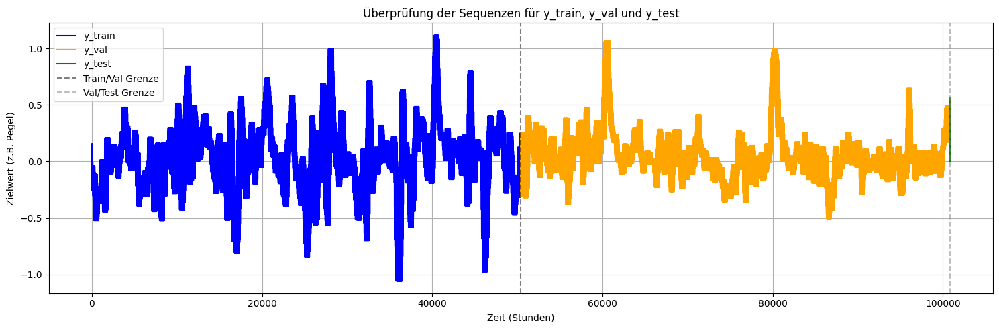

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Flatten y arrays (falls nötig)
y_train_flat = y_train.reshape(-1)
y_val_flat = y_val.reshape(-1)
y_test_flat = y_test_fold.reshape(-1)

# Zeitachsen definieren
t_train = np.arange(len(y_train_flat))
t_val = np.arange(len(y_train_flat), len(y_train_flat) + len(y_val_flat))
t_test = np.arange(len(y_train_flat) + len(y_val_flat), len(y_train_flat) + len(y_val_flat) + len(y_test_flat))

# Plot
plt.figure(figsize=(15, 5))
plt.plot(t_train, y_train_flat, label='y_train', color='blue')
plt.plot(t_val, y_val_flat, label='y_val', color='orange')
plt.plot(t_test, y_test_flat, label='y_test', color='green')
plt.axvline(x=len(y_train_flat), color='black', linestyle='--', alpha=0.5, label='Train/Val Grenze')
plt.axvline(x=len(y_train_flat) + len(y_val_flat), color='gray', linestyle='--', alpha=0.5, label='Val/Test Grenze')

plt.xlabel("Zeit (Stunden)")
plt.ylabel("Zielwert (z.B. Pegel)")
plt.title("Überprüfung der Sequenzen für y_train, y_val und y_test")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


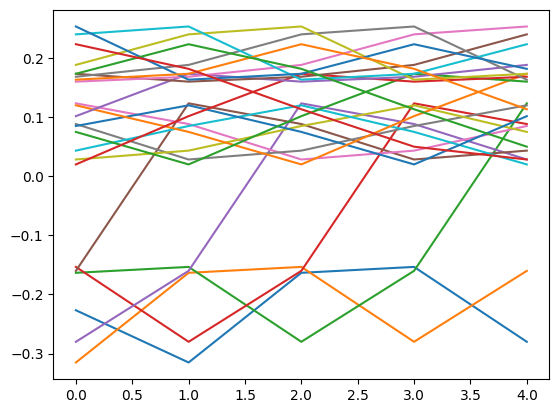

In [ ]:
import matplotlib.pyplot as plt

for i in range(0, y_val.shape[1]):
    plt.plot(y_val[:, i][:5], label=f"Feature {i}")

plt.show()


In [ ]:
dd

NameError: name 'dd' is not defined

# Archive


In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt

# Festlegen der Shapes
n_samples = 1968
horizon = 168
n_classes = 5

# 1. Wasserpegel generieren (echte Werte: y_test)
# Werte in [0.5 m, 2.5 m], inkl. Sturmflutlevel
y_test = np.random.uniform(0.5, 2.5, size=(n_samples, horizon))

# 2. Vorhergesagte Wasserpegel (ähnlich wie y_test + Rauschen)
y_pred_test = y_test + np.random.normal(0, 0.1, size=(n_samples, horizon))

# 3. Klassenvorhersagen (als Wahrscheinlichkeiten)
# Hier simulieren wir Softmax-Ausgaben mit höherer Wahrscheinlichkeit für richtige Klasse
class_indices = np.digitize(y_test, bins=[1.0, 1.25, 1.5, 2.0])  # Klassen: 0–4
class_pred_test = np.zeros((n_samples, horizon, n_classes))

for i in range(n_samples):
    for t in range(horizon):
        true_class = class_indices[i, t]
        probs = np.random.dirichlet(np.ones(n_classes))  # zufällige Verteilung
        probs[true_class] += 2.0  # erhöhe Wahrscheinlichkeit der richtigen Klasse
        class_pred_test[i, t] = probs / probs.sum()

# In Torch konvertieren (optional)
class_pred_test = torch.tensor(class_pred_test, dtype=torch.float32)
y_pred_test = torch.tensor(y_pred_test, dtype=torch.float32)
y_test = torch.tensor(y_test, dtype=torch.float32)


# convertieren zu numpy
class_pred_test = class_pred_test.numpy()
y_pred_test = y_pred_test.numpy()
y_test = y_test.numpy()

# Shapes anzeigen
print("Shape of class_pred_test:", class_pred_test.shape)
print("Shape of y_pred_test:", y_pred_test.shape)
print("Shape of y_test:", y_test.shape)


Shape of class_pred_test: (1968, 168, 5)
Shape of y_pred_test: (1968, 168)
Shape of y_test: (1968, 168)


In [ ]:
class_pred_test





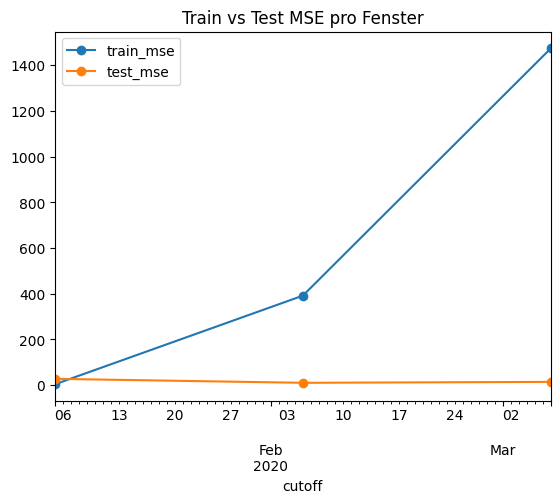

      cutoff  fit_time  predict_time    train_mse   test_mse
0 2020-01-05  0.010502      0.014316     3.686242  27.716148
1 2020-02-05  0.009841      0.013853   391.522472  10.290496
2 2020-03-07  0.010859      0.014374  1473.429677  14.347729


In [ ]:
import pandas as pd
import time
import matplotlib.pyplot as plt
import numpy as np
from mlforecast import MLForecast
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Beispiel-Daten generieren (z. B. eigene ersetzen)
def generate_dummy(n_series=3, days=100):
    dfs = []
    
    dates = pd.date_range('2020-01-01', periods=days, freq='D')
    y = pd.Series(range(days)) + np.random.randn(days)
    dfs.append(pd.DataFrame({'unique_id': 'Flens', 'ds': dates, 'y': y}))
    return pd.concat(dfs)

df = generate_dummy()

# Setup
n_windows, h = 3, 5
step = (len(df['ds'].unique()) - h) // n_windows

model = MLForecast(
    models=[RandomForestRegressor(n_estimators=10, random_state=0)],
    freq='D',
    lags=[1, 2, 3]
)

records = []

for i in range(n_windows):
    cutoff = df['ds'].unique()[i * step + h - 1]
    train = df[df['ds'] <= cutoff]
    test = df[(df['ds'] > cutoff) & (df['ds'] <= cutoff + pd.Timedelta(days=h))]

    t0 = time.time()
    model.fit(train, static_features=[])
    fit_t = time.time() - t0

    t1 = time.time()
    preds = model.predict(
        h=h,
        new_df=train,
        #X_df=test[['unique_id', 'ds']]  # kein Exog in diesem Beispiel
    )
    pred_t = time.time() - t1

    merged = test[['unique_id', 'ds', 'y']].merge(preds, on=['unique_id', 'ds'])
    #display(merged.head())
    tmse = mean_squared_error(merged['y'], merged['RandomForestRegressor'])
    # Train-MSE per Fenster: optional – z. B. aus letzten Horizon-Werten
    train_true = train.tail(h)
    # Nur für eine Serie sinnvoll!
    train_pred = model.predict(h=len(train), new_df=train)
    train_pred = train_pred.sort_values(['unique_id', 'ds'])
    train_sorted = train.sort_values(['unique_id', 'ds'])

    
    train_mse = mean_squared_error(train_sorted['y'].values, train_pred['RandomForestRegressor'].values)
    records.append({
        'cutoff': cutoff,
        'fit_time': fit_t,
        'predict_time': pred_t,
        'train_mse': train_mse,
        'test_mse': tmse
    })

cv_df = pd.DataFrame(records)

# Plot
cv_df.set_index('cutoff')[['train_mse', 'test_mse']].plot(marker='o')
plt.title('Train vs Test MSE pro Fenster')
plt.show()

print(cv_df)


In [ ]:
import numpy as np

# Beispielwerte für y_true und y_hat
y_true = np.array([1.0, 1.2, 2.6, 3.2, 4.0])
y_hat  = np.array([1.2, 2.0, 3.0, 3.6, 2.4])

bins = [1.0, 1.25, 1.5, 2.0]

# Ordne die Werte in Klassen ein
y_true_class = np.digitize(y_true, bins)   # Werte ≤1.5→0, (1.5,2.5]→1, (2.5,3.5]→2, >3.5→3
y_pred_class = np.digitize(y_hat, bins)

print("y_true:", y_true)
print("y_true_class:", y_true_class)
print("y_hat:", y_hat)
print("y_pred_class:", y_pred_class)

y_true: [1.  1.7 2.6 3.2 4. ]
y_true_class: [1 3 4 4 4]
y_hat: [1.2 2.  3.  3.6 2.4]
y_pred_class: [1 4 4 4 4]


In [ ]:
import pandas as pd

import numpy as np
# Combined Score=α⋅(1−Recall)+(1−α)⋅MSE

df = pd.DataFrame({
    'time': pd.date_range('2023-01-01', periods=5, freq='h'),
    'feauture1': np.random.randn(5),
    'feature2': np.random.randn(5),
    'feature3': np.random.randn(5),
    'is_surge': [0, 1, 0, 1, 0],
    'y': [5.0, 7.0, 4.5, 8.0, 6.5],
    'y_hat': [5.1, 6.9, 4.8, 7.8, 6.2]
})

df['is_surge'] = df['is_surge'].astype(bool)



from sklearn.metrics import recall_score, mean_squared_error
import numpy as np

def custom_combined_score(df, alpha, threshold = 1):
    # df enthält y und y_hat
    y_true_reg = df['y'].values
    y_pred_reg = df['y_hat'].values

    # Klassifikation durch Schwellwert (z. B. Sturmflut > 6.0)
    y_true_class = (y_true_reg > threshold).astype(int)
    y_pred_class = (y_pred_reg > threshold).astype(int)

    recall = recall_score(y_true_class, y_pred_class)
    mse = mean_squared_error(y_true_reg, y_pred_reg)

    score = alpha * (1-recall) + (1 - alpha) * mse
    return score

# Beispielaufruf der Funktion
alpha = 0.5  # Gewichtung für Recall und MSE
score = custom_combined_score(df, alpha)
print(f"Custom combined score: {score}")


Custom combined score: 0.023999999999999973


In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from mlforecast import MLForecast
from lightgbm import LGBMRegressor
import numpy as np
from statsforecast import StatsForecast
from statsforecast.models import AutoARIMA
from statsforecast.arima import arima_string

from xgboost import XGBRegressor
import pandas as pd
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


## Load and Process Data

In [ ]:

# Beispiel: df_mlforecast hat schon Spalten ["series_id", "ds", "y"] + evtl. Regs.
# Und der Index von df_mlforecast ist auf "ds" gesetzt (oder "ds" ist eine Spalte vom Typ datetime).


def prepare_ml_data(df):
    """
    Vorverarbeitung der Daten für MLForecast. 
    Rename slev to y and time to ds, 
    add unique_id.
    """
    df = df.copy()
    df = df.rename(columns={'slev': 'y', 'time': 'ds'})
    df['unique_id'] = 'Flensburg'
    df['ds'] = pd.to_datetime(df['ds'], format='%Y-%m-%d %H:%M:%S')
    return df



def load_test_data(periods=20160):
    """
    Erzeugt einen Datensatz mit stündlichen Messungen über `periods` Stunden,
    wobei 'slev' und die Features jeweils als Kombination aus Sinus- und Cosinus-Kurven aufgebaut sind.
    """
    # 1) Zeit-Index anlegen
    df = pd.DataFrame({
        'time': pd.date_range(start='2022-12-03', periods=periods, freq='h')
    })
    df['time'] = pd.to_datetime(df['time'])

    # 2) Zur Erzeugung der Sinus/Cosinus-Muster nutzen wir einen fortlaufenden Zähler (t = 0, 1, 2, ...)
    t = np.arange(periods)

    # 3) Beispiel für Tageszyklus: Periode = 24 Stunden
    #    sin_day  = sin(2π * t / 24)
    #    cos_day  = cos(2π * t / 24)
    sin_day = np.sin(2 * np.pi * t / 24)
    cos_day = np.cos(2 * np.pi * t / 24)

    # 4) Beispiel für Wochenzyklus: Periode = 7×24 Stunden = 168
    sin_week = np.sin(2 * np.pi * t / 168)
    cos_week = np.cos(2 * np.pi * t / 168)

    # 5) Du kannst jetzt verschiedene Kombinationen bauen:
    #    - slev: Basierend auf Tages- und Wochenzyklus + etwas zufälliges Rauschen
    #    - feature1, feature2, feature3: jeweils unterschiedliche Frequenzen/Kombinationen
    
    # a) slev = Basis-Pegel (z.B. 5) + 3×Sinus(Tageszyklus) + 1.5×Cosinus(Wochenzyklus) + kleines Rauschen
    df['slev'] = (
        5
        + 3 * sin_day
        + 1.5 * cos_week
        + np.random.normal(scale=0.2, size=periods)  # Kleines Rauschen, damit es nicht zu perfekt ist
    )

    # b) feature1: reiner Tageszyklus mit größerer Amplitude
    df['feature1'] = (
        50  # Basis-Level
        + 20 * sin_day
        + 5 * cos_day
    )

    # c) feature2: Mischform aus Wochen- und Tageszyklus
    df['feature2'] = (
        30
        + 10 * sin_day
        + 10 * sin_week
    )

    # d) feature3: höherfrequentes Rauschen + Cosinus eines Monatszyklus (angenommen 30 Tage = 720 Stunden)
    sin_month = np.sin(2 * np.pi * t / 720)
    df['feature3'] = (
        10
        + 5 * cos_week
        + 3 * sin_month
        + np.random.normal(scale=0.5, size=periods)
    )

    # e) feature4: reiner Wochenzyklus
    df['feature4'] = (
        20
        + 15 * sin_week
        + np.random.normal(scale=0.3, size=periods)
    )
    # f) feature5: reiner Tageszyklus mit größerer Amplitude
    df['feature5'] = (
        10
        + 8 * sin_day
        + np.random.normal(scale=0.2, size=periods)
    )
    # g) feature6: reiner Wochenzyklus mit größerer Amplitude
    df['feature6'] = (
        15
        + 12 * sin_week
        + np.random.normal(scale=0.3, size=periods)
    )

    return df



df = load_test_data()

df = prepare_ml_data(df)



## Configure ML Pipeline

In [ ]:


params_rf = {'random_state': 42,
             'n_jobs': -1}

pipe_rf = Pipeline([
    ('scaler', StandardScaler()),
    ('model', RandomForestRegressor(**params_rf))
])

params_xgb = {'random_state': 42,
              'n_jobs': -1
              }

pipe_xgb = Pipeline([
    ('scaler', MinMaxScaler()),
    ('model', XGBRegressor(**params_xgb))
])

In [ ]:
from utilsforecast.evaluation import evaluate
from utilsforecast.losses import rmse

len_df = len(df)
# 2) Parameter für Backtesting festlegen
initial_train_window    = 24 * 30 * 6   # = 6 months
step_size               = 24 * 7        # 7  days step size
horizon                 = 24 * 7        # 7 days forecast
n_windows = (len_df - initial_train_window) // horizon

# 3) MLForecast-Modell konfigurieren
model = MLForecast(
    models=[pipe_xgb],
    freq="h",                     # "H" = stündliche Daten
    lags=[1, 2],           # z. B. Lags von 1 Tag, 2 Tagen, 1 Woche
)

In [ ]:
df

,ds,y,feature1,feature2,feature3,feature4,feature5,feature6,unique_id
0,2022-12-03 00:00:00,6.746380,55.000000,30.000000,15.284618,19.872309,10.348315,15.060163,Flensburg
1,2022-12-03 01:00:00,7.456505,60.006010,32.962102,14.030659,21.019733,11.711769,15.332160,Flensburg
2,2022-12-03 02:00:00,7.941499,64.330127,35.747301,14.908798,21.281632,13.696892,16.409563,Flensburg
3,2022-12-03 03:00:00,8.467535,67.677670,38.190713,15.014321,21.789681,15.765583,16.906423,Flensburg
4,2022-12-03 04:00:00,9.545393,69.820508,40.150677,16.182937,22.599604,16.788980,16.758800,Flensburg
...,...,...,...,...,...,...,...,...,...
20155,2025-03-21 19:00:00,3.558018,31.975579,18.481626,14.629489,16.839726,2.276022,13.228338,Flensburg
20156,2025-03-21 20:00:00,4.113792,35.179492,19.849323,15.309370,17.626878,3.101430,13.480479,Flensburg
20157,2025-03-21 21:00:00,4.406923,39.393398,21.809287,15.156069,18.171015,3.862312,13.841277,Flensburg
20158,2025-03-21 22:00:00,4.807654,44.330127,24.252699,14.994430,18.936729,5.764264,14.633542,Flensburg


## Add PCA

In [ ]:

def add_pca(model, df, n_components=0.99):
    """
    Fügt dem MLForecast-Modell eine PCA-Transformation hinzu.
    """
    # Preprocess the data to extract features
    df_preprocessed = model.preprocess(df, static_features=[])

    # Drop non-feature columns
    features_excluded = ['unique_id', 'ds', 'y']
    df_pca = df_preprocessed.drop(columns=features_excluded)

    # Scale the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(df_pca)

    # Apply PCA
    pca = PCA(n_components=n_components)
    X_pca = pca.fit_transform(X_scaled)

    # Create a DataFrame with PCA components
    df_pca = pd.DataFrame(X_pca, columns=[f'PC{i+1}' for i in range(X_pca.shape[1])])

    # Add back unique_id, ds, and y
    df_pca['unique_id'] = df_preprocessed['unique_id']
    df_pca['ds'] = df_preprocessed['ds']
    df_pca['y'] = df_preprocessed['y']

    df_pca = df_pca.dropna()

    return df_pca

df_pca = add_pca(model, df)
df_pca

,PC1,PC2,PC3,PC4,unique_id,ds,y
2,2.949322,-0.467830,1.024564,-0.555591,Flensburg,2022-12-03 02:00:00,7.941499
3,3.351567,-0.583907,0.810641,-0.223122,Flensburg,2022-12-03 03:00:00,8.467535
4,3.627552,-0.534410,0.917638,0.062462,Flensburg,2022-12-03 04:00:00,9.545393
5,3.546887,-0.353578,1.052283,0.109484,Flensburg,2022-12-03 05:00:00,9.543237
6,3.347998,-0.297269,1.043489,0.266681,Flensburg,2022-12-03 06:00:00,9.423861
...,...,...,...,...,...,...,...
20153,-2.143842,-0.131772,1.516012,-0.040682,Flensburg,2025-03-21 17:00:00,3.881952
20154,-1.946983,-0.079813,1.504630,-0.425865,Flensburg,2025-03-21 18:00:00,3.099711
20155,-1.483826,-0.102817,1.422948,-0.422886,Flensburg,2025-03-21 19:00:00,3.558018
20156,-0.910653,-0.093839,1.265066,-0.481058,Flensburg,2025-03-21 20:00:00,4.113792


## Run Cross Validation on Basic Model

In [ ]:
# 4) Backtesting (cross_validation) ausführen
results = model.cross_validation(
    df=df,
    n_windows=n_windows,
    h=horizon,
    step_size=step_size,
    static_features=[]
)

score = cv_rmse = evaluate(
        results.drop(columns='cutoff'),
        metrics=[rmse],
        agg_fn='mean',
    ).drop('metric', axis=1).iloc[0, 0]

In [ ]:
import pandas as pd
import numpy as np




def model_stats(results):
    # Alle Modellspalten automatisch erkennen (außer Standardspalten)
    model_cols = [col for col in results.columns if col not in ['unique_id', 'ds', 'cutoff', 'y']]
    stats = []
    for model in model_cols:
        # RMSE pro Modell berechnen
        rmse = np.sqrt(np.mean((results['y'] - results[model])**2))                 # RMSE
        mse = np.mean((results['y'] - results[model])**2)                               # MSE
        std = np.std(results['y'] - results[model])                                 # StandardDeviation

        # q1 = np.percentile(results['y'] - results[model], 25) # 25. Perzentil
        # q3 = np.percentile(results['y'] - results[model], 75) # 75. Perzentil

        mape = np.mean(np.abs((results['y'] - results[model]) / results['y'])) * 100
        r = np.corrcoef(results['y'], results[model])[0, 1]  # Pearson-Korrelation

        stats.append({'model': model, 
                      'rmse': rmse, 
                      #'rmse_std': std,
                      'mse': mse,
                    #   'rmse_q1': q1,
                    #   'rmse_q3': q3,
                      'mape': mape,
                      'r': r})
        
    return pd.DataFrame(stats)

# Beispiel-Aufruf:
df_stats = model_stats(results)
display(df_stats)

,model,rmse,mse,mape,r
0,XGBRegressor,0.26064,0.067933,6.005493,0.993998


In [ ]:
# 1) Einzelne RMSE-Werte pro Window holen
cv_rmse_per_window = evaluate(
    results.drop(columns='cutoff'),
    metrics=[rmse],
    agg_fn=None
)
display(cv_rmse_per_window)


,unique_id,metric,XGBRegressor
0,Flensburg,rmse,0.26064


# Optuna

In [ ]:
import optuna
from utilsforecast.evaluation import evaluate
from utilsforecast.losses import rmse
from sklearn.decomposition import PCA

len_df = len(df)
# 2) Parameter für Backtesting festlegen
initial_train_window    = 24 * 30 * 6   # = 6 months
step_size               = 24 * 7        # 7  days step size
horizon                 = 24 * 7        # 7 days forecast
n_windows = (len_df - initial_train_window) // horizon



def objective(trial):
    
    params_xgb = {
            "n_estimators": trial.suggest_int("n_estimators", 50, 300),
            "max_depth": trial.suggest_int("max_depth", 2, 20),
            "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=True),
            "subsample": trial.suggest_float("subsample", 0.5, 1.0),
            "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
            'gamma': trial.suggest_float("gamma", 0.0, 5.0),
            "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 5.0),
            "reg_lambda": trial.suggest_float("reg_lambda", 0.0, 5.0),
            "min_child_weight": trial.suggest_int("min_child_weight", 1, 10),
            "tree_method": "hist",  # 'hist' ist schneller für große Datensätze
            "random_state": 42,
            "n_jobs": -1,
            'objective': "reg:squarederror",
            'verbosity': 1,
        }
    

    lag_options = [
    [1],
    [1, 2],
    [1, 2, 3],
    [1, 2, 3, 4],
    [1, 6, 24],  # 1 Stunde, 6 Stunden, 1 Tag
    ]
    
    lags = trial.suggest_categorical("lags", lag_options)

    pipe_xgb = Pipeline([
        #('scaler', StandardScaler()),
        ('model', XGBRegressor(**params_xgb))
    ])

    # 3) MLForecast-Modell konfigurieren
    model = MLForecast(
        models=[pipe_xgb],
        freq="h",                     # "H" = stündliche Daten
        lags=lags                     # z. B. Lags von 1 Tag, 2 Tagen, 1 Woche
    )

    df_pca = add_pca(model, df)
    

    # 4) Backtesting (cross_validation) ausführen
    results = model.cross_validation(
        df=df_pca,
        n_windows=n_windows,
        h=horizon,
        step_size=step_size,
        static_features=[]
    )

    score = evaluate(
            results.drop(columns='cutoff'),
            metrics=[rmse],
            agg_fn='mean',
        ).drop('metric', axis=1).iloc[0, 0]

    return score

# Ignore UserWarning from Optuna about pruning
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100, show_progress_bar=True, timeout=60*10)


[I 2025-06-04 13:26:53,683] A new study created in memory with name: no-name-8b04af5f-aec0-4cf5-9e29-179b083db2cb
Best trial: 0. Best value: 0.324684:   1%|          | 1/100 [1:14:52<123:32:05, 4492.18s/it, 4492.18/600 seconds]

[I 2025-06-04 14:41:45,979] Trial 0 finished with value: 0.32468403033908094 and parameters: {'n_estimators': 146, 'max_depth': 6, 'learning_rate': 0.022777532764867978, 'subsample': 0.6377840591058657, 'colsample_bytree': 0.6068301781484992, 'gamma': 0.37379462559119614, 'reg_alpha': 1.1152476594293743, 'reg_lambda': 4.800880058401801, 'min_child_weight': 4, 'lags': [1, 2, 3, 4]}. Best is trial 0 with value: 0.32468403033908094.


In [ ]:
def study_stats(study):
    print("\nBeste Parameter:")
    print(study.best_params)

    print("\nBest lags")
    print(study.best_params['lags'])

    print("\nBeste RMSE:")
    print(study.best_value)

    import optuna.visualization as vis

    # Verlauf der Optimierung (Zielwert pro Trial)
    vis.plot_optimization_history(study).show()

    # Wichtigkeit der Hyperparameter
    vis.plot_param_importances(study).show()

    vis.plot_parallel_coordinate(study, params=[pa for pa in list(study.best_params.keys()) if pa not in ['lags']]).show()


study_stats(study)


Beste Parameter:
{'n_estimators': 180, 'max_depth': 20, 'learning_rate': 0.05422328711728345, 'subsample': 0.8797779585757368, 'colsample_bytree': 0.6554018725097439, 'gamma': 1.6903295902212783, 'reg_alpha': 2.4253475195784717, 'reg_lambda': 2.083518734017326, 'min_child_weight': 1, 'lags': [1, 24, 168]}

Best lags
[1, 24, 168]

Beste RMSE:
0.24181128081523237


In [ ]:
# code from: https://nixtlaverse.nixtla.io/mlforecast/docs/how-to-guides/cross_validation.html

import matplotlib.pyplot as plt



import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

def plot_cv(df, df_cv, uid, fname, model_cols=None, last_n=24 * 100):
    if not last_n:
        last_n = len(df)
    if model_cols is None:
        exclude = {'unique_id', 'ds', 'cutoff', 'y'}
        model_cols = [col for col in df_cv.columns if col not in exclude]
    # cutoffs bestimmen ohne query
    cutoffs = df_cv.loc[df_cv['unique_id'] == uid, 'cutoff'].unique()

    
    fig, ax = plt.subplots(nrows=len(cutoffs), ncols=1, figsize=(14, len(cutoffs)*3), gridspec_kw=dict(hspace=0.8))
    if len(cutoffs) == 1:
        ax = [ax]
    for cutoff, axi in zip(cutoffs, ax):
        # df_plot ohne query
        df_plot = df.loc[df['unique_id'] == uid].tail(last_n).set_index('ds')
        df_plot.plot(ax=axi, y='y', label='y', title=f"{uid} - cutoff: {cutoff}")
        for model in model_cols:
            # df_cv_plot ohne query
            mask = (df_cv['unique_id'] == uid) & (df_cv['cutoff'] == cutoff)
            df_cv.loc[mask].set_index('ds').plot(ax=axi, y=model, label=model)
        # X-Achse: nur 12 Labels anzeigen
        ds_vals = df_plot.index
        if len(ds_vals) > 0:
            idx = np.linspace(0, len(ds_vals)-1, 12, dtype=int)
            axi.set_xticks(ds_vals[idx])
            axi.set_xticklabels([ds.strftime('%Y-%m-%d %H:%M') for ds in ds_vals[idx]], rotation=45, ha='right')
    #fig.savefig(fname, bbox_inches='tight')
    plt.show()
    plt.close()


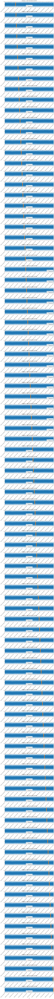

In [ ]:
#5) Ergebnisse anschauen

plot_cv(df, results, 'Flensburg', 'flensburg_cv.png', last_n=None)